In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv(r"C:\Users\lenovo\OneDrive\Desktop\Daily needs\DS Assingments\EDA1\EDA1\Cardiotocographic.csv")
df# loaded the dataset using pandas function

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


# Data Cleaning and Preparation

In [4]:
df.info()  # this function provides the relative information about the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [5]:
df.shape

(2126, 14)

In [6]:
df.isna().sum() # this function is used to calculate the no. of missing values.

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [7]:
df.columns # it represents the columns present in the dataset

Index(['LB', 'AC', 'FM', 'UC', 'DL', 'DS', 'DP', 'ASTV', 'MSTV', 'ALTV',
       'MLTV', 'Width', 'Tendency', 'NSP'],
      dtype='object')

In [8]:
for col in df.columns:                           # here for loop is created to replace all the missing values present in the columns  
    df[col].fillna(df[col].mean(), inplace=True) # we replace the missing values because the data is very important in terms of analysis aspect
print(df.isna().sum())

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64


In [9]:
#df['Tendency']=df['Tendency'].astype('category')
#df['NSP']=df['NSP'].astype('category')
#df.dtypes


<Axes: title={'center': 'Box Plot of Numerical Values'}>

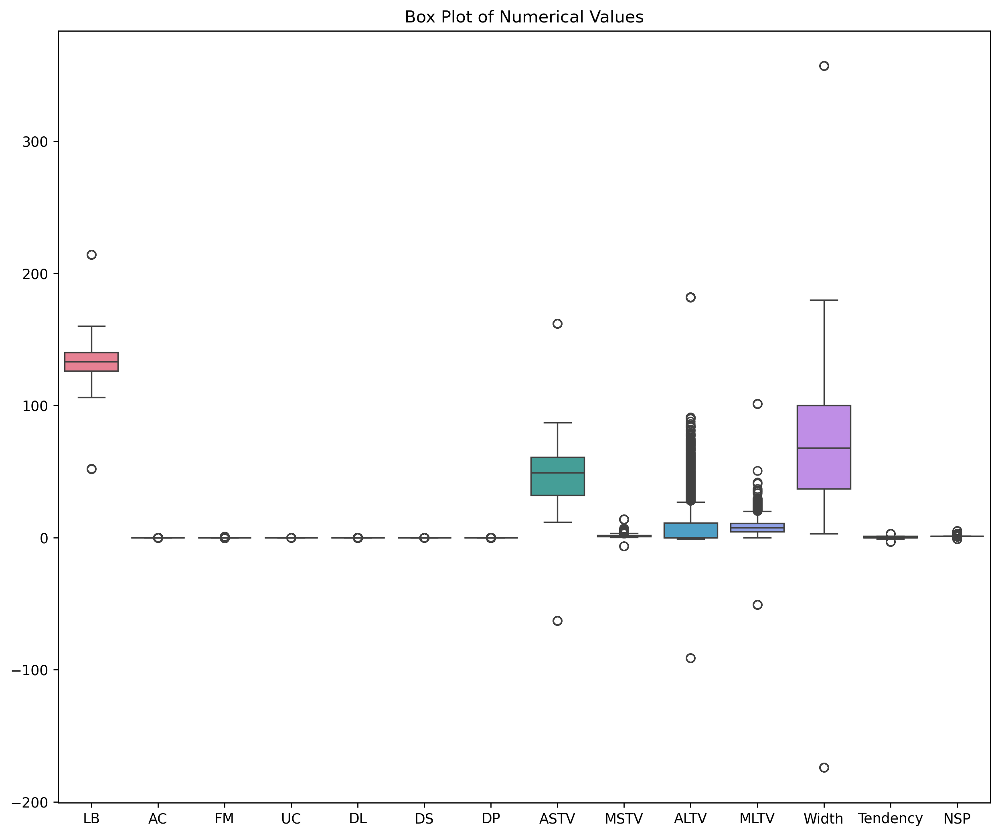

In [10]:
# create a box plot to determine the presence of outliers
plt.rcParams['figure.figsize']=(12,10)
plt.rcParams['figure.dpi']=250
plt.title('Box Plot of Numerical Values')
sn.boxplot(data=df)


In [11]:
def capping(data, columns):
    for col in columns:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3 - q1
        lower = q1 - (1.5*iqr)
        upper = q3 + (1.5*iqr)
        df[col] = np.where(df[col]>upper, upper,np.where(df[col]<lower,lower,df[col]))

In [12]:
columns_for_capping=[ 'LB', 'AC', 'FM', 'UC', 'DL', 'DS', 'DP', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'Width']

In [13]:
capping(df,columns_for_capping)

# Statistical Summary

In [15]:
Statistical_Summary = df.describe()
Statistical_Summary

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.0,2126.0,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.293725,0.003147,0.001568,0.004362,0.001770,0.0,0.0,46.981873,1.304644,6.691678,8.016212,70.321076,0.316371,1.304507
std,9.930227,0.003826,0.002485,0.003001,0.002668,0.0,0.0,17.612745,0.781091,10.378400,5.046784,39.570633,0.642424,0.641426
min,105.000000,-0.008409,-0.003850,-0.005177,-0.004934,0.0,0.0,-11.500000,-0.800000,-16.500000,-4.700000,-57.500000,-3.000000,-1.025988
25%,126.000000,0.000000,0.000000,0.001851,0.000000,0.0,0.0,32.000000,0.700000,0.000000,4.600000,37.000000,0.000000,1.000000
50%,133.000000,0.001668,0.000000,0.004484,0.000000,0.0,0.0,49.000000,1.200000,0.000000,7.500000,68.000000,0.000000,1.000000
75%,140.000000,0.005606,0.002567,0.006536,0.003289,0.0,0.0,61.000000,1.700000,11.000000,10.800000,100.000000,1.000000,1.000000
max,161.000000,0.014015,0.006416,0.013564,0.008224,0.0,0.0,104.500000,3.200000,27.500000,20.100000,194.500000,3.000000,5.000000


# Data Visualization
- created different forms of graphical representation

Text(0, 0.5, 'Value')

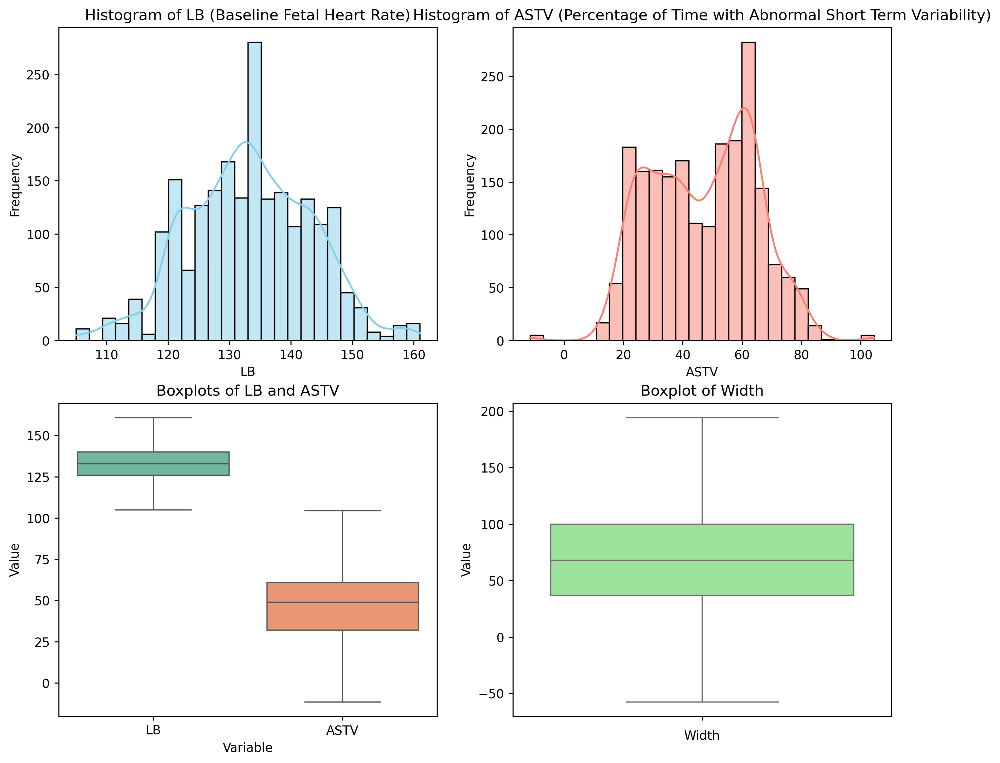

In [17]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 10))

#Histogram
sn.histplot(df['LB'], ax=axes[0, 0], kde=True, color='skyblue')
axes[0, 0].set_title('Histogram of LB (Baseline Fetal Heart Rate)')
axes[0, 0].set_xlabel('LB')
axes[0, 0].set_ylabel('Frequency')

sn.histplot(df['ASTV'], ax=axes[0, 1], kde=True, color='salmon')
axes[0, 1].set_title('Histogram of ASTV (Percentage of Time with Abnormal Short Term Variability)')
axes[0, 1].set_xlabel('ASTV')
axes[0, 1].set_ylabel('Frequency')

# Boxplot
sn.boxplot(data=df[['LB', 'ASTV']], ax=axes[1, 0], palette='Set2')
axes[1, 0].set_title('Boxplots of LB and ASTV')
axes[1, 0].set_xlabel('Variable')
axes[1, 0].set_ylabel('Value')

sn.boxplot(data=df['Width'], ax=axes[1, 1], color='lightgreen')
axes[1, 1].set_title('Boxplot of Width')
axes[1, 1].set_xlabel('Width')
axes[1, 1].set_ylabel('Value')

Text(0, 0.5, 'Frequency')

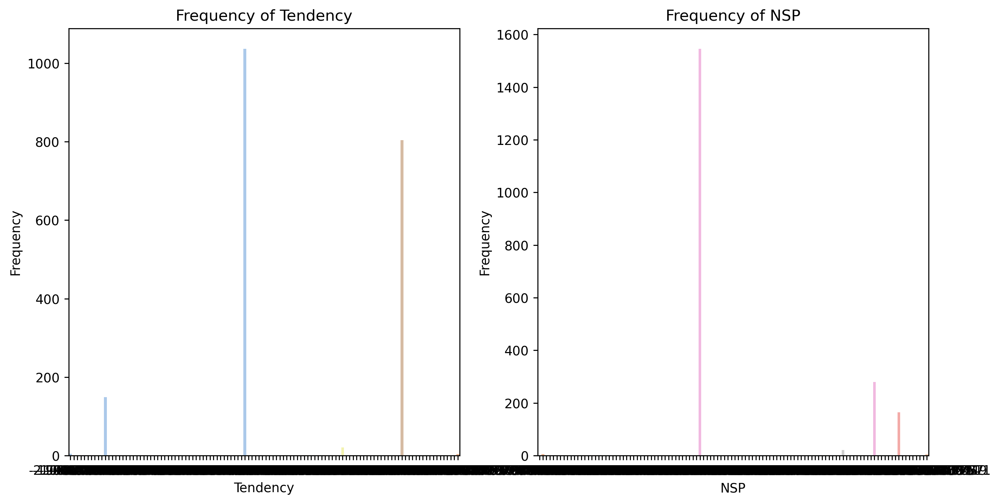

In [18]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

# Bar chart for "Tendency"
sn.countplot(x='Tendency', data=df, ax=axes[0], palette='pastel', hue='Tendency', legend=False)
axes[0].set_title('Frequency of Tendency')
axes[0].set_xlabel('Tendency')
axes[0].set_ylabel('Frequency')

# Bar chart for "NSP"
sn.countplot(x='NSP', data=df, ax=axes[1], palette='pastel', hue='NSP', legend=False)
axes[1].set_title('Frequency of NSP')
axes[1].set_xlabel('NSP')
axes[1].set_ylabel('Frequency')


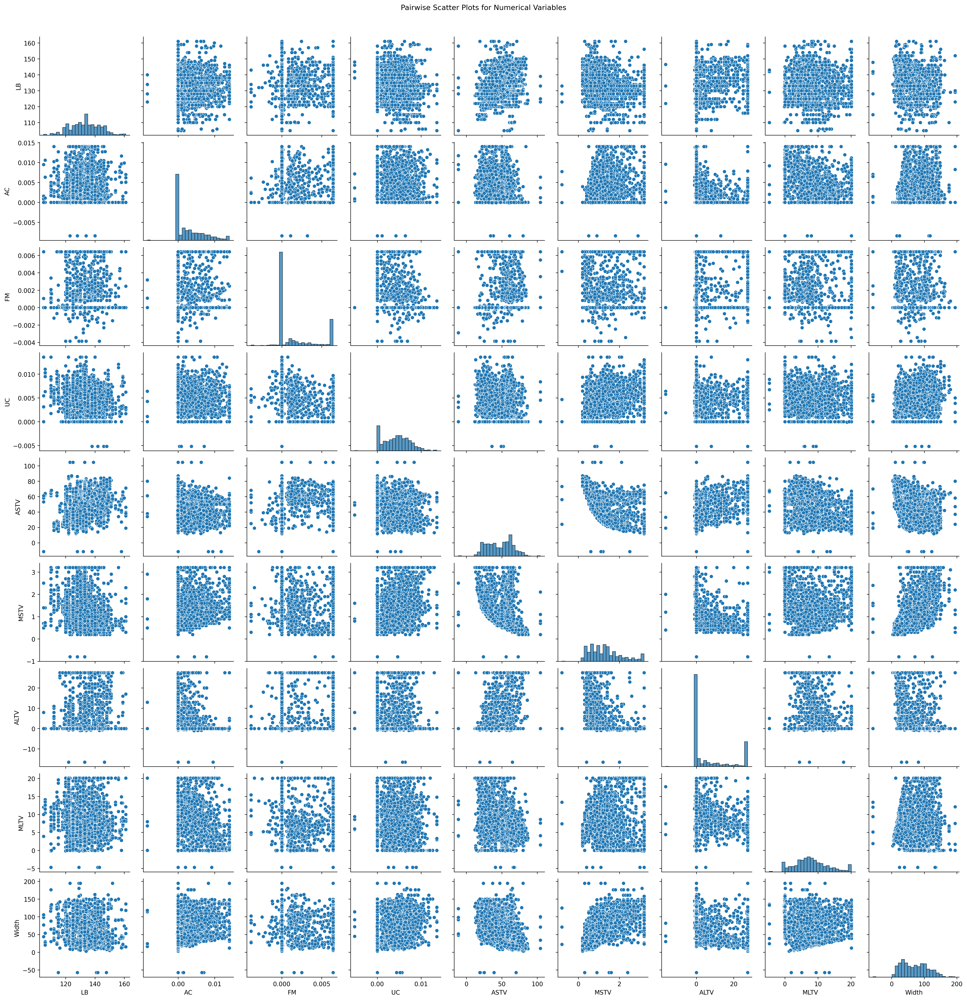

In [19]:
#create scatter plot
# Scatter plots for pairs of numerical variables
sn.pairplot(df[['LB', 'AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'Width']])
plt.suptitle('Pairwise Scatter Plots for Numerical Variables', y=1.02)
plt.show()

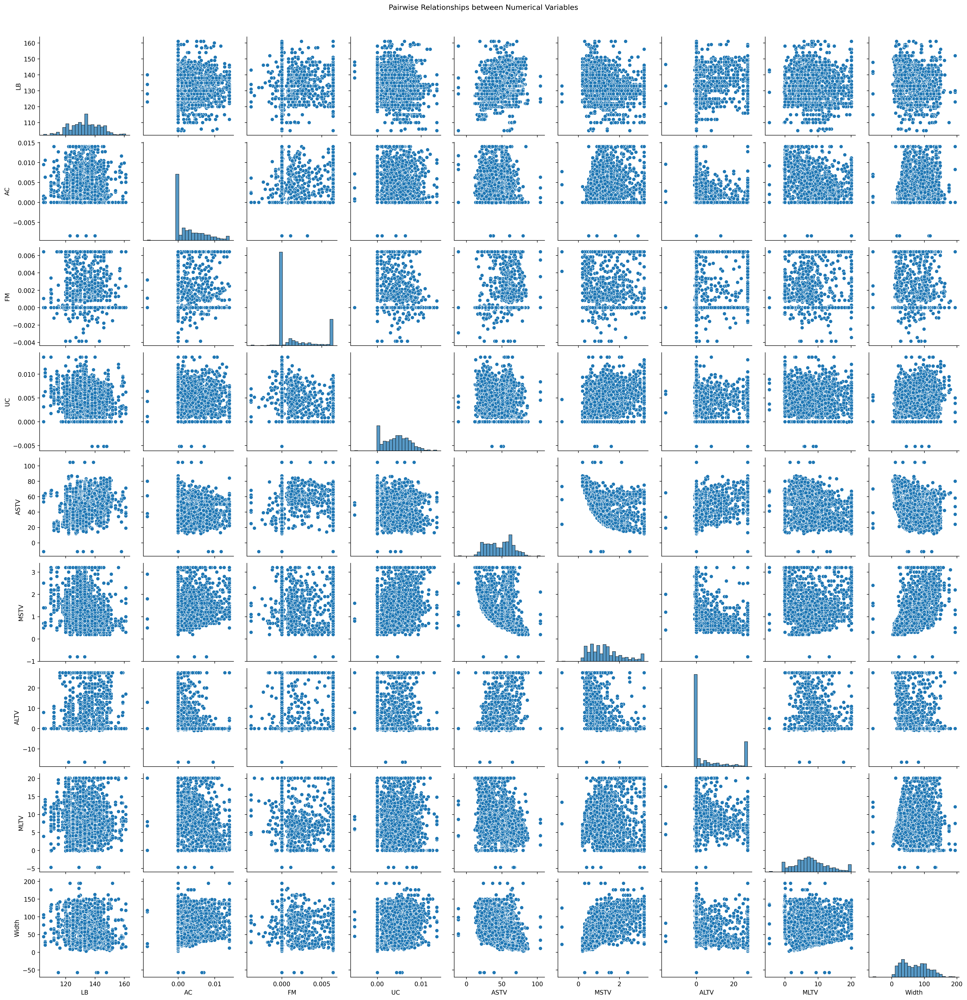

In [20]:
#heat map for patterns
# Pair plot for numerical variables
sn.pairplot(df[['LB', 'AC', 'FM', 'UC', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'Width']])
plt.suptitle('Pairwise Relationships between Numerical Variables', y=1.02)
plt.show()

# Pattern Recognition 

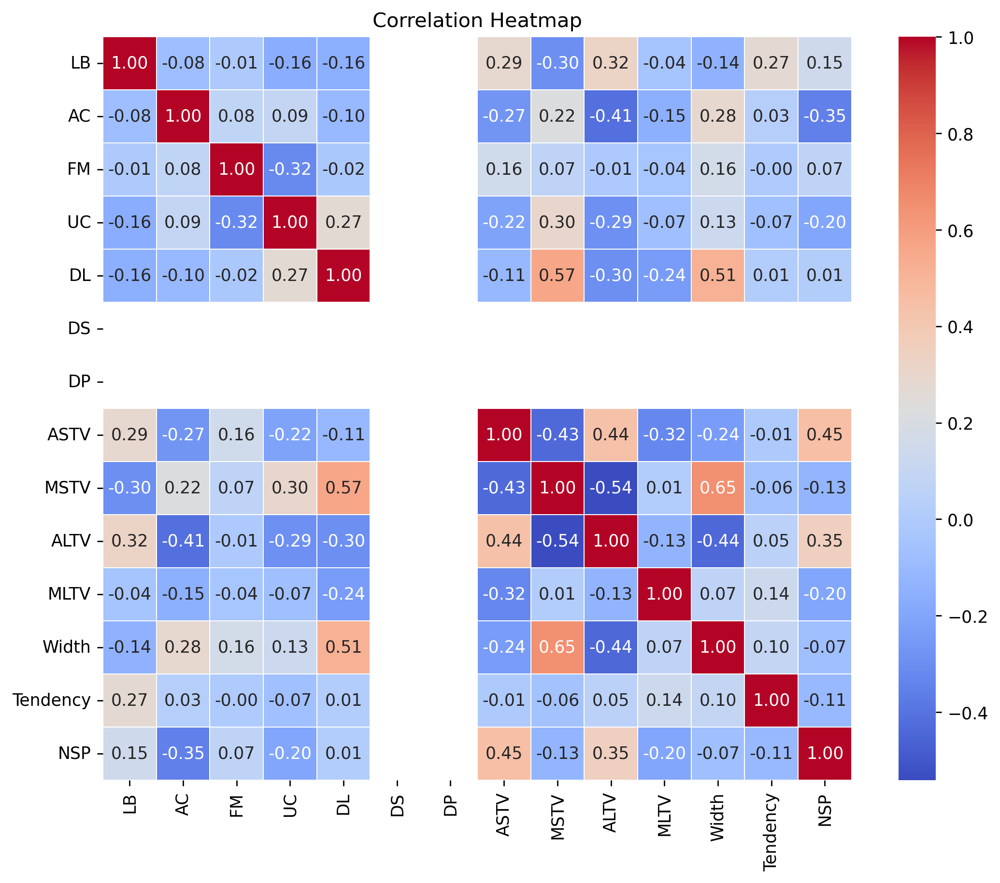

In [22]:
# with the help of heat map we find the relation between the data set
plt.figure(figsize=(10, 8))
sn.heatmap(df.corr(), annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Summary over exploratory analysis.

Distribution of Variables:
The dataset contains numerical variables related to fetal heart rate monitoring, including baseline fetal heart rate (LB), accelerations (AC), fetal movements (FM), uterine contractions (UC), and various variability measures (ASTV, MSTV, ALTV, MLTV), among others.

Central Tendency and Dispersion:
Summary statistics revealed the central tendency and dispersion of numerical variables, such as mean, median, standard deviation, and interquartile range.

Correlation Analysis:
The correlation heatmap indicated positive correlations between LB and other variables such as AC, FM, and UC, suggesting that these variables tend to increase together. 

Temporal Analysis:
Dataset does not contain explicit temporal data.

- Due to lack of domain Knowledge it was insufficent to carry out further analysis